<a href="https://colab.research.google.com/github/ajadams123/ATMS-597-SP-2020-Project-3-Group-H/blob/master/Project3_GroupH_2_28.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Instructions

Task: Create code using python xarray to organize and reduce climate data. The goal of this analysis will be to detect global atmospheric circulation patterns (or teleconnections) associated with extreme daily precipitation in a certain part of the globe. You will

(1) Aggregate daily rainfall data from the Global Precipitaiton Climatology Project 1 degree daily precipitation data over the period **1996 - 2019** into a single file from daily files, available here: [https://www.ncei.noaa.gov/data/global-precipitation-climatology-project-gpcp-daily/access/ ].

(2) Determine the 95% values of daily precipitation during a selected particular 3-month period (given in the table below by group) over the grid box closest to the city you are examining. Plot a cumulative distribution function of all values daily precipitation values and illustrate the 95% value of daily precipitation in millimeters.

(3) Using output from the NCEP Reanalysis [https://journals.ametsoc.org/doi/pdf/10.1175/1520-0477(1996)077%3C0437%3ATNYRP%3E2.0.CO%3B2](Kalnay et al. 1996), compute the **global mean fields** and **seasonal anomaly fields** for days meeting and exceeding the threshold of precipitation calculated in the previous step (using the 1981-2010 as a base period for anomalies) of

* **250 hPa wind vectors and wind speed,**
* 500 hPa winds and geopotential height,
* 850 hPa temperature, specific humidity, and winds,
* **skin temperature, and surface winds,** and
* **total atmospheric column water vapor.**

(4) Create maps showing **the mean fields for the extreme precipitation day composites**, **long term mean composites for the selected months**, and **the anomaly fields for each variable**. Use contours and vectors when appropriate.

NCEP reanalysis data is available from the NOAA Physical Sciences Division THREDDS server here: [https://www.esrl.noaa.gov/psd/thredds/catalog/Datasets/catalog.html]. xarray can access these files directly. For example, to get the long term mean for u-wind by month, you can access

`data = xr.open_dataset('https://www.esrl.noaa.gov/psd/thredds/dodsC/Datasets/ncep.reanalysis.derived/pressure/uwnd.mon.ltm.nc',engine='netcdf4')`

Aggregations of the 6-hourly data are available like this:

`data = xr.open_dataset('https://www.esrl.noaa.gov/psd/thredds/dodsC/Aggregations/ncep.reanalysis/pressure/uwnd.nc', engine='netcdf4')`

## Data retrieval and processing

### module import

In [2]:
%pylab inline
!pip install netcdf4
!pip install pydap # to read remote netcdf files
!pip install wget
import xarray as xr
import pandas as pd
from datetime import datetime
import numpy as np
from bs4 import BeautifulSoup
import requests
import matplotlib.pyplot as plt
import re
import wget

Populating the interactive namespace from numpy and matplotlib
     |████████████████████████████████| 4.1MB 2.5MB/s 
     |████████████████████████████████| 317kB 31.2MB/s 
     |████████████████████████████████| 2.3MB 2.8MB/s 
     |████████████████████████████████| 122kB 19.7MB/s 
  Created wheel for wget: filename=wget-3.2-cp36-none-any.whl size=9682 sha256=b8c2b48ffda1d7e2fc5208363150d882a81b9f77a211618e9a33a96367e66cf1
  Stored in directory: /root/.cache/pip/wheels/40/15/30/7d8f7cea2902b4db79e3fea550d7d7b85ecb27ef992b618f3f
Successfully built wget


### Download GPCP data

In [0]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
%cd /content/drive/My Drive/Project_3_gpcp/

/content/drive/My Drive/Project_3_gpcp


In [0]:
years = np.arange(1996,2020)
url_home = 'https://www.ncei.noaa.gov/data/global-precipitation-climatology-project-gpcp-daily/access/'
# Get the file names from the website by looping through each year
gpcp_file_name = []
datasets = []
for year in years:
    gpcp_url=url_home +str(year)+'/'
    response = requests.get(gpcp_url)

    soup = BeautifulSoup(response.text, 'html.parser')
    gpcp_file_list = soup.find_all('a', href=re.compile("\.nc$"))
    #print(len(gpcp_file_list))
    print(year)
    for s in gpcp_file_list:
        filename=s.contents[0]
        file_url = (gpcp_url+filename)
        #print(file_url)
        wget.download(file_url)
        nc = xr.open_dataset(filename)
        precip = xr.DataArray(nc['precip'],dims=['time','latitude','longitude']) # load the precip data into a data array 
        datasets.append(precip) #append the datasets list with the precip data array
        !rm "{filename}"
combined = xr.concat(datasets, dim='time')

1996
1997
1998
1999
2000
2001
2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019


In [0]:
combined_dataset = combined.to_dataset(name='precip')

In [0]:
mdata=combined_dataset.sel(time=~combined_dataset.indexes['time'].duplicated())

In [0]:
mdata.to_netcdf('combined_1996_2019_precip.nc') #save the xarray dataset to a single netcdf file

### Getting the 95 percentile of daily precipitation for Melbourne, Australia.

In [0]:
mdata = xr.open_dataset('combined_1996_2019_precip.nc')
mdata_season=mdata.sel(time=(mdata['time.season'] == 'DJF'))

In [0]:
mdata_melbourne = mdata_season.sel(longitude=144.9631-1,latitude=-37.8136,method='nearest')

In [0]:
melbourne_precip=mdata_melbourne.where(mdata_melbourne>-9999.0, drop=True)

In [0]:
melbourne_results=melbourne_precip.precip.values

In [0]:
np.percentile(melbourne_results,95)

9.318601274490355

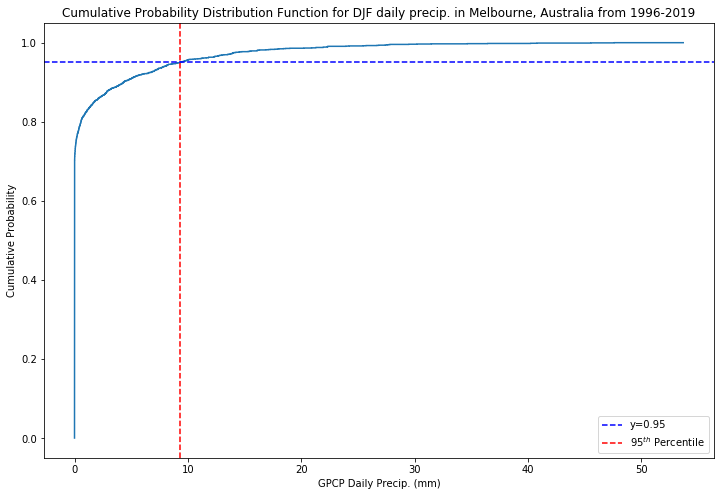

In [0]:
n = np.arange(1,len(melbourne_results)+1) / np.float(len(melbourne_results))
Xs = np.sort(melbourne_results)
fig, ax = plt.subplots(figsize=(12,8))
ax.step(Xs,n) 
plt.axhline(0.95,c='b',ls='--',label='y=0.95')
plt.axvline(np.percentile(melbourne_results,95),c='r',ls='--',label='$95^{th}$ Percentile')
plt.xlabel('GPCP Daily Precip. (mm)')
plt.ylabel('Cumulative Probability')
plt.title('Cumulative Probability Distribution Function for DJF daily precip. in Melbourne, Australia from 1996-2019')
plt.legend()
plt.show()

In [0]:
melbourne_95 = mdata_melbourne.where(mdata_melbourne.precip >= np.percentile(melbourne_results,95),drop=True)

In [0]:
melbourne_95

<xarray.Dataset>
Dimensions:    (time: 104)
Coordinates:
    latitude   float32 -38.0
    longitude  float32 144.0
  * time       (time) datetime64[ns] 1997-01-27 1997-02-06 ... 2019-02-06
Data variables:
    precip     (time) float32 40.795677 9.493706 ... 24.217918 21.276585

In [0]:
melbourne_95.to_netcdf('melbourne_95.nc',encoding={'precip': {'_FillValue': -9999.0}})

### Global long term mean data

In [0]:
ltm_baseurl = 'https://www.esrl.noaa.gov/psd/thredds/dodsC/Datasets/ncep.reanalysis.derived'
ltm_item = {
    'uwnd_250': ['/pressure/uwnd.mon.1981-2010.ltm.nc', True, 250,'uwnd'], # True indicates that a level should be selected
    'vwnd_250': ['/pressure/vwnd.mon.1981-2010.ltm.nc', True, 250,'vwnd'],
    'skt': ['/surface_gauss/skt.sfc.mon.1981-2010.ltm.nc', False, 0, 'skt'],
    'uwnd_sfc': ['/surface/uwnd.sig995.mon.1981-2010.ltm.nc', False, 0, 'uwnd'],
    'vwnd_sfc': ['/surface/vwnd.sig995.mon.1981-2010.ltm.nc', False, 0, 'vwnd'],
    'pr_wtr': ['/surface/pr_wtr.eatm.mon.1981-2010.ltm.nc', False, 0, 'pr_wtr'],
    'wspd_250': ['/pressure/wspd.mon.1981-2010.ltm.nc', True, 250, 'wspd'],
    }

ltm_data = {}
for key in ltm_item.keys():
    if ltm_item[key][1] == False:
        d = xr.open_dataset(ltm_baseurl + ltm_item[key][0], engine='netcdf4')
    elif ltm_item[key][1] == True:
        d = xr.open_dataset(ltm_baseurl + ltm_item[key][0], engine='netcdf4').sel(level=ltm_item[key][2])
    data = d.sel(time=d.time.dt.season=='DJF')
    data_mean = data[ltm_item[key][3]].mean(dim='time')
    ltm_data.update( {key : data_mean} )

ltm_data

/usr/local/lib/python3.6/dist-packages/xarray/coding/times.py:426: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/usr/local/lib/python3.6/dist-packages/numpy/core/_asarray.py:85: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.6/dist-packages/xarray/coding/times.py:426: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/usr/local/lib/python3.6/dist-packages/numpy/core/_asarray.py:85: SerializationWarning: Unable to decode time ax

{'pr_wtr': <xarray.DataArray 'pr_wtr' (lat: 73, lon: 144)>
 array([[ 2.2243922 ,  2.2243922 ,  2.2243922 , ...,  2.2243922 ,
          2.2243922 ,  2.2243922 ],
        [ 1.8074471 ,  1.7992644 ,  1.7932905 , ...,  1.837708  ,
          1.8268242 ,  1.8167206 ],
        [ 2.2656069 ,  2.323239  ,  2.381238  , ...,  2.111063  ,
          2.1579583 ,  2.2101562 ],
        ...,
        [ 0.35422215,  0.5226148 ,  0.67996675, ..., -0.1455404 ,
          0.0130877 ,  0.18235047],
        [ 0.414454  ,  0.44262624,  0.47272268, ...,  0.34229788,
          0.36278233,  0.38792774],
        [ 0.56360286,  0.56360286,  0.56360286, ...,  0.56360286,
          0.56360286,  0.56360286]], dtype=float32)
 Coordinates:
   * lon      (lon) float32 0.0 2.5 5.0 7.5 10.0 ... 350.0 352.5 355.0 357.5
   * lat      (lat) float32 90.0 87.5 85.0 82.5 80.0 ... -82.5 -85.0 -87.5 -90.0,
 'skt': <xarray.DataArray 'skt' (lat: 94, lon: 192)>
 array([[-32.721664, -32.74824 , -32.784206, ..., -32.616726, -32.651386,


In [0]:
# note that skt ltm data are in degC while daily data are in degK; 
# for the ease of the anomaly calculation we will update the numbers in 'skt'
# DataArray so they also have degK as units:
skt_mean_K = ltm_data['skt'] + 273.15
ltm_data.update(skt = skt_mean_K) 
ltm_data

{'pr_wtr': <xarray.DataArray 'pr_wtr' (lat: 73, lon: 144)>
 array([[ 2.2243922 ,  2.2243922 ,  2.2243922 , ...,  2.2243922 ,
          2.2243922 ,  2.2243922 ],
        [ 1.8074471 ,  1.7992644 ,  1.7932905 , ...,  1.837708  ,
          1.8268242 ,  1.8167206 ],
        [ 2.2656069 ,  2.323239  ,  2.381238  , ...,  2.111063  ,
          2.1579583 ,  2.2101562 ],
        ...,
        [ 0.35422215,  0.5226148 ,  0.67996675, ..., -0.1455404 ,
          0.0130877 ,  0.18235047],
        [ 0.414454  ,  0.44262624,  0.47272268, ...,  0.34229788,
          0.36278233,  0.38792774],
        [ 0.56360286,  0.56360286,  0.56360286, ...,  0.56360286,
          0.56360286,  0.56360286]], dtype=float32)
 Coordinates:
   * lon      (lon) float32 0.0 2.5 5.0 7.5 10.0 ... 350.0 352.5 355.0 357.5
   * lat      (lat) float32 90.0 87.5 85.0 82.5 80.0 ... -82.5 -85.0 -87.5 -90.0,
 'skt': <xarray.DataArray 'skt' (lat: 94, lon: 192)>
 array([[240.42833, 240.40175, 240.36578, ..., 240.53326, 240.49861,
     

### extreme precip days data

In [0]:
!ls

melbourne_95_update.nc	sample_data


In [4]:
dates = xr.open_dataset('melbourne_95_update.nc', engine = 'netcdf4')
dates['time']

<xarray.DataArray 'time' (time: 104)>
array(['1997-01-27T00:00:00.000000000', '1997-02-06T00:00:00.000000000',
       '1998-01-06T00:00:00.000000000', '1998-01-07T00:00:00.000000000',
       '1998-02-07T00:00:00.000000000', '1998-02-15T00:00:00.000000000',
       '1998-12-13T00:00:00.000000000', '1998-12-25T00:00:00.000000000',
       '1999-01-07T00:00:00.000000000', '1999-01-28T00:00:00.000000000',
       '1999-12-07T00:00:00.000000000', '1999-12-15T00:00:00.000000000',
       '1999-12-26T00:00:00.000000000', '2000-01-24T00:00:00.000000000',
       '2000-02-19T00:00:00.000000000', '2000-02-20T00:00:00.000000000',
       '2000-12-17T00:00:00.000000000', '2001-01-04T00:00:00.000000000',
       '2001-12-01T00:00:00.000000000', '2001-12-02T00:00:00.000000000',
       '2002-01-21T00:00:00.000000000', '2002-02-03T00:00:00.000000000',
       '2002-02-07T00:00:00.000000000', '2002-02-15T00:00:00.000000000',
       '2002-12-30T00:00:00.000000000', '2002-12-31T00:00:00.000000000',
       '2003-02-20T00:00:00.000000000', '2003-12-03T00:00:00.000000000',
       '2003-12-19T00:00:00.000000000', '2004-01-04T00:00:00.000000000',
       '2004-12-06T00:00:00.000000000', '2004-12-10T00:00:00.000000000',
       '2005-01-29T00:00:00.000000000', '2005-02-01T00:00:00.000000000',
       '2005-02-02T00:00:00.000000000', '2005-02-07T00:00:00.000000000',
       '2005-02-08T00:00:00.000000000', '2005-02-23T00:00:00.000000000',
       '2005-12-12T00:00:00.000000000', '2005-12-15T00:00:00.000000000',
       '2006-01-21T00:00:00.000000000', '2006-02-25T00:00:00.000000000',
       '2007-01-18T00:00:00.000000000', '2007-01-20T00:00:00.000000000',
       '2007-02-15T00:00:00.000000000', '2007-12-06T00:00:00.000000000',
       '2007-12-21T00:00:00.000000000', '2008-01-17T00:00:00.000000000',
       '2008-01-18T00:00:00.000000000', '2008-02-03T00:00:00.000000000',
       '2008-12-04T00:00:00.000000000', '2008-12-09T00:00:00.000000000',
       '2008-12-17T00:00:00.000000000', '2009-12-17T00:00:00.000000000',
       '2009-12-31T00:00:00.000000000', '2010-01-31T00:00:00.000000000',
       '2010-02-04T00:00:00.000000000', '2010-02-10T00:00:00.000000000',
       '2010-02-21T00:00:00.000000000', '2010-12-05T00:00:00.000000000',
       '2010-12-06T00:00:00.000000000', '2011-01-09T00:00:00.000000000',
       '2011-01-10T00:00:00.000000000', '2011-01-11T00:00:00.000000000',
       '2011-01-12T00:00:00.000000000', '2011-01-13T00:00:00.000000000',
       '2011-01-23T00:00:00.000000000', '2011-02-04T00:00:00.000000000',
       '2011-02-05T00:00:00.000000000', '2011-02-18T00:00:00.000000000',
       '2011-12-18T00:00:00.000000000', '2012-01-07T00:00:00.000000000',
       '2012-02-10T00:00:00.000000000', '2012-02-26T00:00:00.000000000',
       '2012-02-27T00:00:00.000000000', '2012-12-14T00:00:00.000000000',
       '2013-02-14T00:00:00.000000000', '2013-02-21T00:00:00.000000000',
       '2013-02-25T00:00:00.000000000', '2013-12-03T00:00:00.000000000',
       '2013-12-22T00:00:00.000000000', '2014-01-01T00:00:00.000000000',
       '2014-12-02T00:00:00.000000000', '2014-12-03T00:00:00.000000000',
       '2015-01-03T00:00:00.000000000', '2015-01-08T00:00:00.000000000',
       '2015-02-13T00:00:00.000000000', '2015-02-15T00:00:00.000000000',
       '2016-01-03T00:00:00.000000000', '2016-01-21T00:00:00.000000000',
       '2016-01-22T00:00:00.000000000', '2016-01-26T00:00:00.000000000',
       '2016-12-05T00:00:00.000000000', '2017-01-07T00:00:00.000000000',
       '2017-02-05T00:00:00.000000000', '2017-02-06T00:00:00.000000000',
       '2017-12-01T00:00:00.000000000', '2017-12-18T00:00:00.000000000',
       '2017-12-29T00:00:00.000000000', '2018-01-12T00:00:00.000000000',
       '2018-12-08T00:00:00.000000000', '2018-12-28T00:00:00.000000000',
       '2018-12-29T00:00:00.000000000', '2019-02-06T00:00:00.000000000'],
      dtype='datetime64[ns]')
Coordinates:
    latitude   float32 ...
    longitude  float32 ...
  * time       (time) datetime64[ns] 1997-01-27 1997-02-06 ... 2019-

In [5]:
# since the first xprecip date is in 1997, so we start from 1997
years = pd.date_range(start='1997-01-01', end='2019-12-01', freq='AS') # 30 years

xprecip_baseurl = 'https://www.esrl.noaa.gov/psd/thredds/dodsC/Datasets/ncep.reanalysis.dailyavgs'
# a dictionary of: 
# 'varname' = [url, whether it has levels, what level to use, varname in DataSet]
xprecip_item = { 
    'uwnd_250': ['/pressure/uwnd.', True, 250, 'uwnd'], 
    'vwnd_250': ['/pressure/vwnd.', True, 250, 'vwnd'],
    'skt': ['/surface_gauss/skt.sfc.gauss.', False, 0, 'skt'],
    'uwnd_sfc': ['/surface/uwnd.sig995.', False, 0, 'uwnd'],
    'vwnd_sfc': ['/surface/vwnd.sig995.', False, 0, 'vwnd'],
    'pr_wtr': ['/surface/pr_wtr.eatm.', False, 0, 'pr_wtr']
    #'wspd_250' is calculated later
    }

xprecip_data = {}
for key in xprecip_item.keys():
    datasets = []
    lv = int(xprecip_item[key][2])
    for iyr in years.year:
        url = xprecip_baseurl + xprecip_item[key][0] + str(iyr) + '.nc'
        dates_iyr = dates.sel(time = dates['time'].dt.year == iyr)['time']
        d = xr.open_dataset(url, engine = 'netcdf4').sel(time = dates_iyr)
        if xprecip_item[key][1] == True:
            d = d.sel(level = lv)
        datasets.append(d)
    data = xr.concat(datasets, dim = 'time')
    data_mean = data[xprecip_item[key][3]].mean(dim = 'time')
    xprecip_data.update( {key : data_mean} )

xprecip_data


{'pr_wtr': <xarray.DataArray 'pr_wtr' (lat: 73, lon: 144)>
 array([[ 2.4548068 ,  2.4548068 ,  2.4548068 , ...,  2.4548068 ,
          2.4548068 ,  2.4548068 ],
        [ 2.037738  ,  2.0331235 ,  2.0343738 , ...,  2.0548537 ,
          2.047739  ,  2.0438936 ],
        [ 2.6884122 ,  2.751872  ,  2.8104296 , ...,  2.513556  ,
          2.567209  ,  2.6259587 ],
        ...,
        [ 0.42980543,  0.60869896,  0.77317196, ..., -0.10226137,
          0.0693249 ,  0.25071767],
        [ 0.4817291 ,  0.51307374,  0.548554  , ...,  0.39201722,
          0.41696927,  0.44855624],
        [ 0.57533365,  0.57533365,  0.57533365, ...,  0.57533365,
          0.57533365,  0.57533365]], dtype=float32)
 Coordinates:
     longitude  float32 144.0
     latitude   float32 -38.0
   * lat        (lat) float32 90.0 87.5 85.0 82.5 ... -82.5 -85.0 -87.5 -90.0
   * lon        (lon) float32 0.0 2.5 5.0 7.5 10.0 ... 350.0 352.5 355.0 357.5,
 'skt': <xarray.DataArray 'skt' (lat: 94, lon: 192)>
 array([[242.43

In [6]:
# adding wspd_250 to xprecip dict
uwnd_mean = xprecip_data['uwnd_250']
vwnd_mean = xprecip_data['vwnd_250']
wdsp_mean = np.sqrt(uwnd_mean**2 + vwnd_mean**2)

# give it a name to match ltm dataset
wdsp_mean.name = 'wspd'

xprecip_data.update( {'wspd_250' : wdsp_mean} )

ltm_data['wspd_250'], xprecip_data['wspd_250']


NameError: ignored

### calculate anomalies 

In [0]:
keys = ltm_data.keys()

anom_data = {}
for key in keys:
    anom = xprecip_data[key] - ltm_data[key]
    anom_data.update( {key: anom} )

anom_data

{'pr_wtr': <xarray.DataArray 'pr_wtr' (lat: 73, lon: 144)>
 array([[0.23041463, 0.23041463, 0.23041463, ..., 0.23041463, 0.23041463,
         0.23041463],
        [0.23029101, 0.23385906, 0.24108326, ..., 0.21714568, 0.22091484,
         0.22717297],
        [0.4228053 , 0.42863297, 0.4291916 , ..., 0.402493  , 0.40925074,
         0.41580248],
        ...,
        [0.07558328, 0.08608419, 0.09320521, ..., 0.04327903, 0.0562372 ,
         0.0683672 ],
        [0.06727508, 0.0704475 , 0.07583132, ..., 0.04971933, 0.05418694,
         0.0606285 ],
        [0.01173079, 0.01173079, 0.01173079, ..., 0.01173079, 0.01173079,
         0.01173079]], dtype=float32)
 Coordinates:
     longitude  float32 144.0
     latitude   float32 -38.0
   * lat        (lat) float32 90.0 87.5 85.0 82.5 ... -82.5 -85.0 -87.5 -90.0
   * lon        (lon) float32 0.0 2.5 5.0 7.5 10.0 ... 350.0 352.5 355.0 357.5,
 'skt': <xarray.DataArray 'skt' (lat: 94, lon: 192)>
 array([[2.0018158 , 2.0212402 , 2.034439  , ..., 1

## plotting with Cartopy

### install Cartopy and import modules

In [8]:
# install cartopy
!apt-get -qq install libproj-dev proj-data proj-bin libgeos-dev
!pip install Cython
!pip install --upgrade --force-reinstall shapely --no-binary shapely
!pip install cartopy

Selecting previously unselected package libgeos-dev.
(Reading database ... 134443 files and directories currently installed.)
Preparing to unpack .../libgeos-dev_3.6.2-1build2_amd64.deb ...
Unpacking libgeos-dev (3.6.2-1build2) ...
Selecting previously unselected package libproj-dev:amd64.
Preparing to unpack .../libproj-dev_4.9.3-2_amd64.deb ...
Unpacking libproj-dev:amd64 (4.9.3-2) ...
Selecting previously unselected package proj-bin.
Preparing to unpack .../proj-bin_4.9.3-2_amd64.deb ...
Unpacking proj-bin (4.9.3-2) ...
Setting up libproj-dev:amd64 (4.9.3-2) ...
Setting up libgeos-dev (3.6.2-1build2) ...
Setting up proj-bin (4.9.3-2) ...
Processing triggers for man-db (2.8.3-2ubuntu0.1) ...
     |████████████████████████████████| 358kB 2.8MB/s 
Skipping wheel build for shapely, due to binaries being disabled for it.
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
  Found existing installation: Shapely 1.7.0
    U

In [0]:
# import modules
import cartopy
import cartopy.crs as ccrs #coordinate reference system
import cartopy.feature as cfeature
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import numpy as np

### global mean maps and vector plots for extreme precip days

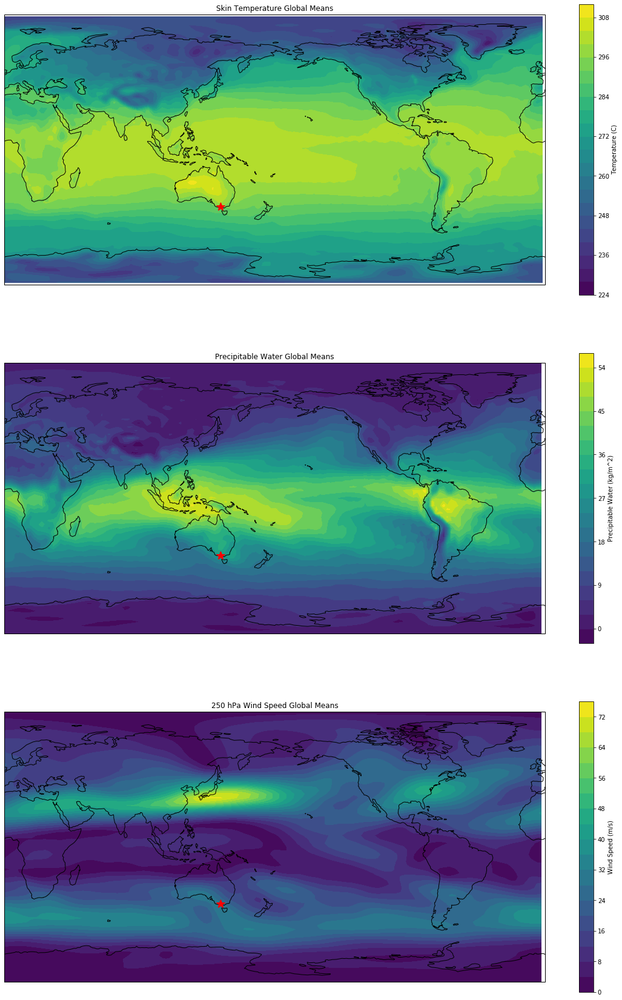

In [0]:
# create figure, axes instances.
fig = plt.figure(figsize=(20, 30))

mkeys = ['skt', 'pr_wtr', 'wspd_250','Temperature (C)', 'Precipitable Water (kg/m^2)', 'Wind Speed (m/s)','Skin Temperature', 'Precipitable Water', '250 hPa Wind Speed']
n = int(len(mkeys) / 3)

for i in range(n):
    ax = plt.subplot(n, 1, i+1, projection=ccrs.PlateCarree(central_longitude=180))
    data = xprecip_data[mkeys[i]]
    plt.contourf(data['lon'], data['lat'], data, transform=ccrs.PlateCarree(), levels=20)
    ax.set_global(); # for global dataset
    ax.coastlines();
    plt.colorbar().set_label(mkeys[i+3])
    plt.title(mkeys[i+6] + ' Global Means')
    plt.plot(144-180,-38, marker='*', markersize = 15, color = 'red')

plt.show()
fig.savefig('sktprwspglobmeans.png')

/usr/local/lib/python3.6/dist-packages/cartopy/io/__init__.py:260: DownloadWarning: Downloading: http://naciscdn.org/naturalearth/110m/physical/ne_110m_ocean.zip
  warnings.warn('Downloading: {}'.format(url), DownloadWarning)
/usr/local/lib/python3.6/dist-packages/cartopy/io/__init__.py:260: DownloadWarning: Downloading: http://naciscdn.org/naturalearth/110m/physical/ne_110m_land.zip
  warnings.warn('Downloading: {}'.format(url), DownloadWarning)


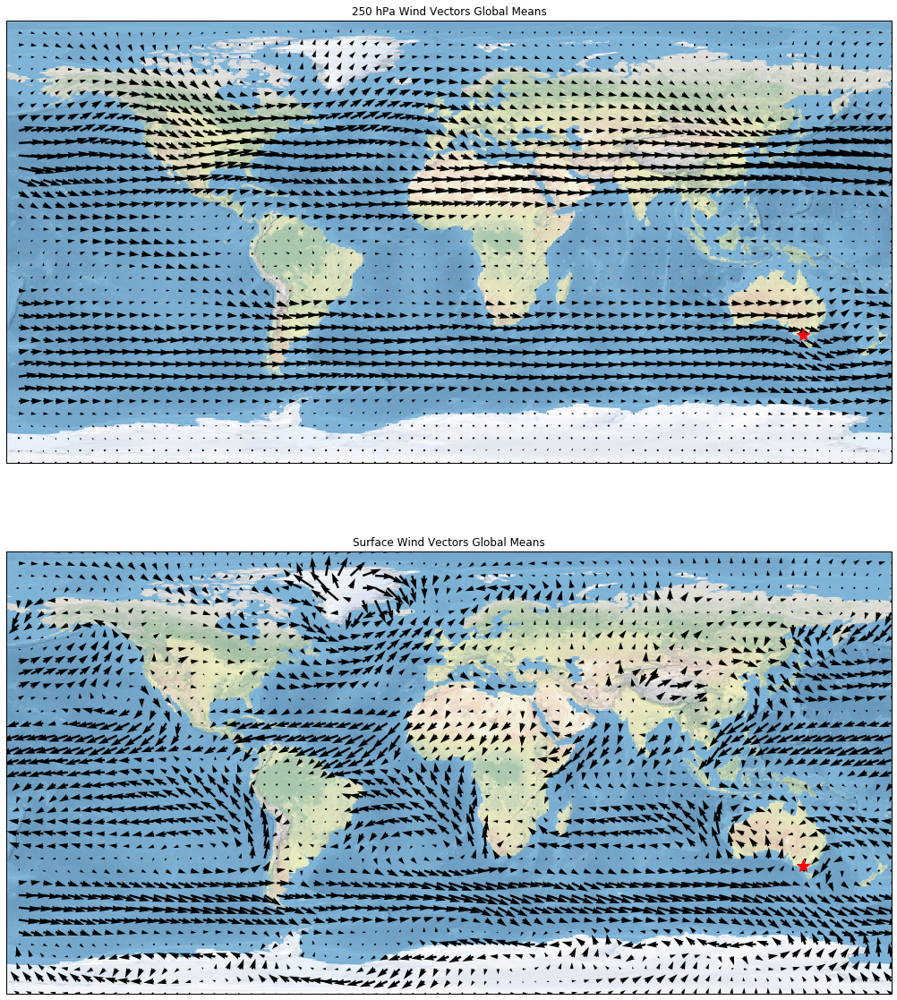

In [10]:
fig = plt.figure(figsize=(20,20))

plot_dict = xprecip_data
skip = 2

# 250hPa wind vectors
ax1 = plt.subplot(2, 1, 1, projection=ccrs.PlateCarree())
ax1.stock_img()
ax1.set_global()
ax1.set_title('250 hPa Wind Vectors Global Means')
ax1.quiver(plot_dict['uwnd_250']['lon'][::skip], plot_dict['uwnd_250']['lat'][::skip], plot_dict['uwnd_250'][::skip,::skip], plot_dict['vwnd_250'][::skip,::skip])#, transform=vector_crs)
ax1.plot(144,-38, marker='*', markersize = 15, color = 'red')


# surface wind vectors
ax2 = plt.subplot(2, 1, 2, projection=ccrs.PlateCarree())
ax2.set_global()
ax2.stock_img()
ax2.set_title('Surface Wind Vectors Global Means')
ax2.quiver(plot_dict['uwnd_sfc']['lon'][::skip], plot_dict['uwnd_sfc']['lat'][::skip], plot_dict['uwnd_sfc'][::skip,::skip], plot_dict['vwnd_sfc'][::skip,::skip])#, transform=vector_crs)
ax2.plot(144,-38, marker='*', markersize = 15, color = 'red')

plt.show()
fig.savefig('250surfwindvglobmeans.png')

### long term mean maps and vector plots

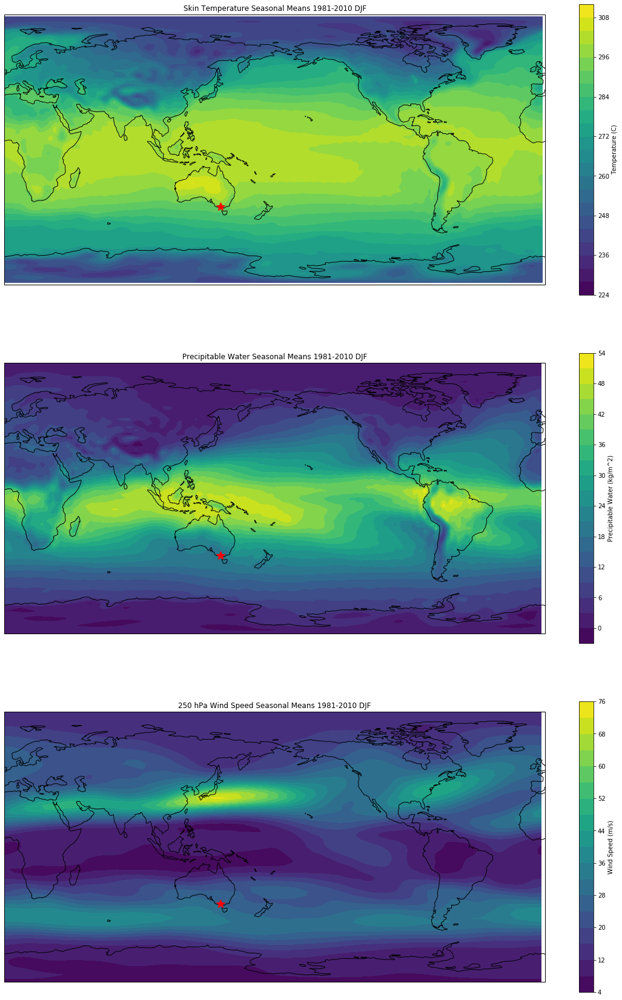

In [0]:
# create figure, axes instances.
fig = plt.figure(figsize=(20, 30))

mkeys = ['skt', 'pr_wtr', 'wspd_250','Temperature (C)', 'Precipitable Water (kg/m^2)', 'Wind Speed (m/s)','Skin Temperature', 'Precipitable Water', '250 hPa Wind Speed']
n = int(len(mkeys) / 3)

for i in range(n):
    ax = plt.subplot(n, 1, i+1, projection=ccrs.PlateCarree(central_longitude=180))
    ###plotting dict###
    data = ltm_data[mkeys[i]]
    plt.contourf(data['lon'], data['lat'], data, transform=ccrs.PlateCarree(), levels = 20, cmap = 'viridis')
    ax.set_global(); # for global dataset
    ax.coastlines();
    plt.colorbar().set_label(mkeys[i+3])
    plt.plot(144-180,-38, marker='*', markersize = 15, color = 'red')
    plt.title(mkeys[i+6] + ' Seasonal Means 1981-2010 DJF')

plt.show()
fig.savefig('sktprwspdjfmeans.png')

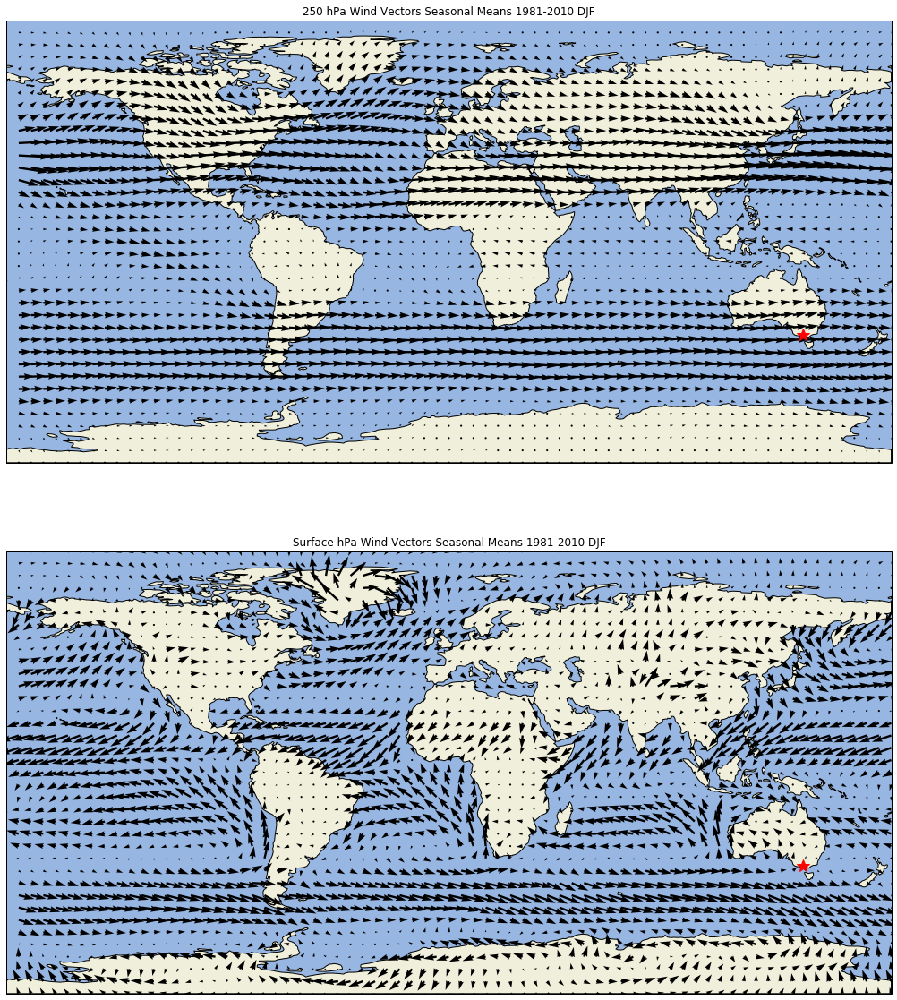

In [0]:
fig = plt.figure(figsize=(20,20))
#wnd250 = anom_data['uwnd_250']

plot_dict = ltm_data
skip = 2

# 250hPa wind vectors
ax1 = plt.subplot(2, 1, 1, projection=ccrs.PlateCarree())
ax1.add_feature(cartopy.feature.OCEAN, zorder=0)
ax1.add_feature(cartopy.feature.LAND, zorder=0, edgecolor='black')
ax1.set_global()
ax1.stock_img
#ax1.gridlines()
ax1.set_title('250 hPa Wind Vectors Seasonal Means 1981-2010 DJF')
ax1.quiver(plot_dict['uwnd_250']['lon'][::skip], plot_dict['uwnd_250']['lat'][::skip], plot_dict['uwnd_250'][::skip,::skip], plot_dict['vwnd_250'][::skip,::skip])
ax1.plot(144,-38, marker='*', markersize = 15, color = 'red')


# surface wind vectors
ax2 = plt.subplot(2, 1, 2, projection=ccrs.PlateCarree())
ax2.add_feature(cartopy.feature.OCEAN, zorder=0)
ax2.add_feature(cartopy.feature.LAND, zorder=0, edgecolor='black')
ax2.set_global()
ax2.stock_img()
#ax2.gridlines()
ax2.set_title('Surface hPa Wind Vectors Seasonal Means 1981-2010 DJF')
ax2.quiver(plot_dict['uwnd_sfc']['lon'][::skip], plot_dict['uwnd_sfc']['lat'][::skip], plot_dict['uwnd_sfc'][::skip,::skip], plot_dict['vwnd_sfc'][::skip,::skip])
ax2.plot(144,-38, marker='*', markersize = 15, color = 'red')

plt.show()
fig.savefig('250surfwindvdjfmeans.png')

### Anomalies maps and vector plots

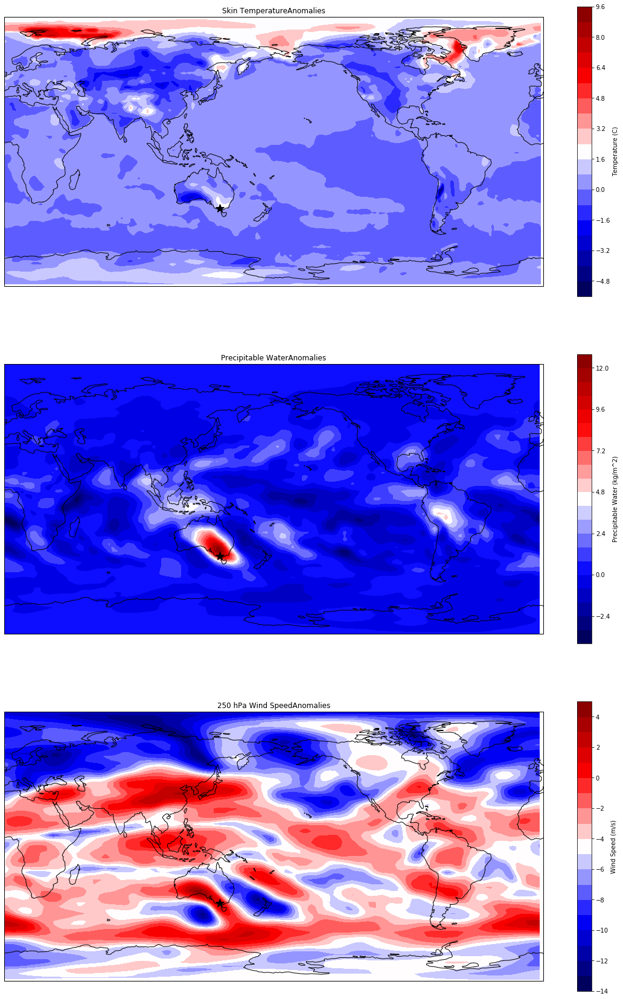

In [0]:
# create figure, axes instances.
fig = plt.figure(figsize=(20, 30))

mkeys = ['skt', 'pr_wtr', 'wspd_250','Temperature (C)', 'Precipitable Water (kg/m^2)', 'Wind Speed (m/s)','Skin Temperature', 'Precipitable Water', '250 hPa Wind Speed']
n = int(len(mkeys) / 3)

for i in range(n):
    ax = plt.subplot(n, 1, i+1, projection=ccrs.PlateCarree(central_longitude=180))
    data = anom_data[mkeys[i]]
    plt.contourf(data['lon'], data['lat'], data, transform=ccrs.PlateCarree(), cmap='seismic', levels = 20)
    ax.set_global(); # for global dataset
    ax.coastlines();
    plt.colorbar().set_label(mkeys[i+3])
    plt.title(mkeys[i+6] + 'Anomalies')
    plt.plot(144-180,-38, marker='*', markersize = 15, color = 'black')

plt.show()
fig.savefig('sktprwspanom.png')


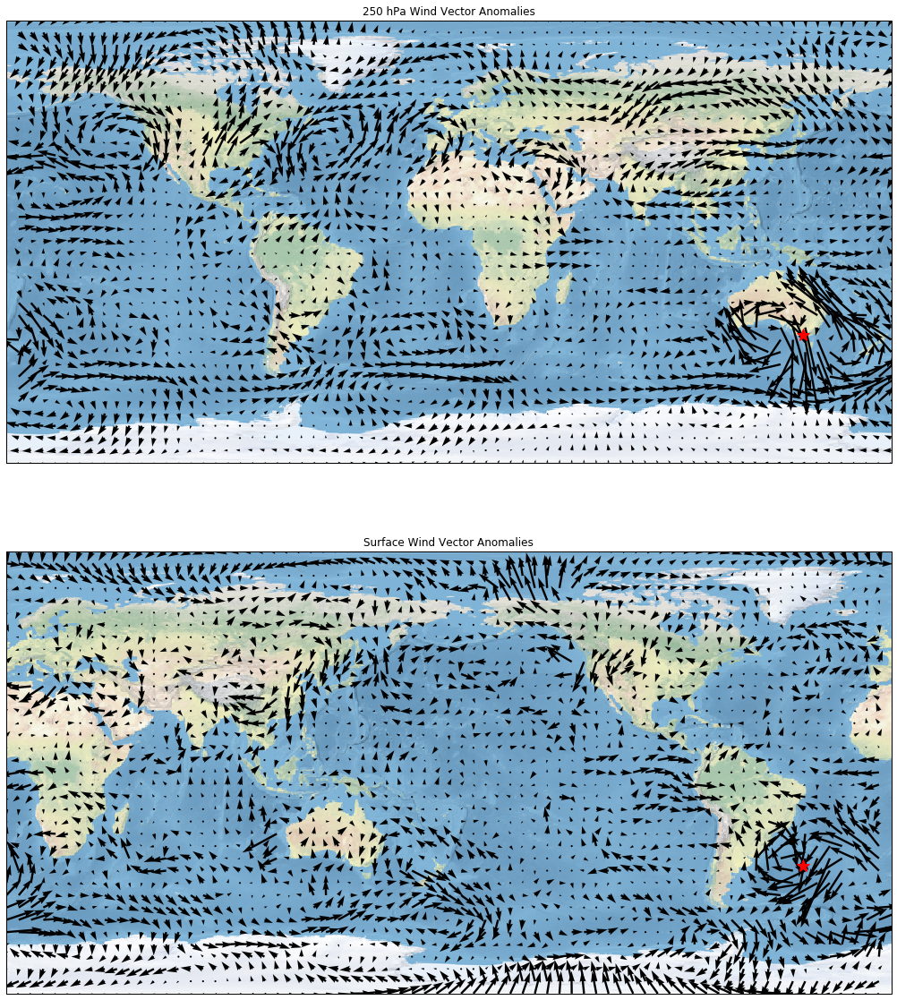

In [0]:
fig = plt.figure(figsize=(20,20))
#wnd250 = anom_data['uwnd_250']

plot_dict = anom_data
skip = 2

# 250hPa wind vectors
ax1 = plt.subplot(2, 1, 1, projection=ccrs.PlateCarree())
ax1.set_global()
ax1.stock_img()
ax1.plot(144,-38, marker='*', markersize = 15, color = 'red')
ax1.set_title('250 hPa Wind Vector Anomalies')

ax1.quiver(plot_dict['uwnd_250']['lon'][::skip], plot_dict['uwnd_250']['lat'][::skip], plot_dict['uwnd_250'][::skip,::skip], plot_dict['vwnd_250'][::skip,::skip])


# surface wind vectors
ax2 = plt.subplot(2, 1, 2, projection=ccrs.PlateCarree())
ax2.stock_img()
ax2.set_global()
ax2.plot(144,-38, marker='*', markersize = 15, color = 'red')
ax2.set_title('Surface Wind Vector Anomalies')
ax2.quiver(plot_dict['uwnd_sfc']['lon'][::skip], plot_dict['uwnd_sfc']['lat'][::skip], plot_dict['uwnd_sfc'][::skip,::skip], plot_dict['vwnd_sfc'][::skip,::skip])


plt.show()

fig.savefig('250surfwndanom.png')

## Creating data and plots for 500 hPa and 850 hPa variables

In [0]:
#downloading long term monthly means for anomaly calculation
hght500mean1981_2010 = xr.open_dataset('http://www.esrl.noaa.gov/psd/thredds/dodsC/Datasets/ncep.reanalysis.derived/pressure/hgt.mon.1981-2010.ltm.nc',engine='netcdf4').sel(level=500)
uwind500mean1981_2010 = xr.open_dataset('http://www.esrl.noaa.gov/psd/thredds/dodsC/Datasets/ncep.reanalysis.derived/pressure/uwnd.mon.1981-2010.ltm.nc',engine='netcdf4').sel(level=500)
vwind500mean1981_2010 = xr.open_dataset('http://www.esrl.noaa.gov/psd/thredds/dodsC/Datasets/ncep.reanalysis.derived/pressure/vwnd.mon.1981-2010.ltm.nc',engine='netcdf4').sel(level=500)
uwind850mean1981_2010 = xr.open_dataset('http://www.esrl.noaa.gov/psd/thredds/dodsC/Datasets/ncep.reanalysis.derived/pressure/uwnd.mon.1981-2010.ltm.nc',engine='netcdf4').sel(level=850)
vwind850mean1981_2010 = xr.open_dataset('http://www.esrl.noaa.gov/psd/thredds/dodsC/Datasets/ncep.reanalysis.derived/pressure/vwnd.mon.1981-2010.ltm.nc',engine='netcdf4').sel(level=850)
temp850mean1981_2010 = xr.open_dataset('http://www.esrl.noaa.gov/psd/thredds/dodsC/Datasets/ncep.reanalysis.derived/pressure/air.mon.1981-2010.ltm.nc',engine='netcdf4').sel(level=850)
sphum850mean1981_2010 = xr.open_dataset('http://www.esrl.noaa.gov/psd/thredds/dodsC/Datasets/ncep.reanalysis.derived/pressure/shum.mon.1981-2010.ltm.nc',engine='netcdf4').sel(level=850)

/usr/local/lib/python3.6/dist-packages/xarray/coding/times.py:426: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/usr/local/lib/python3.6/dist-packages/numpy/core/_asarray.py:85: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.6/dist-packages/xarray/coding/times.py:426: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/usr/local/lib/python3.6/dist-packages/numpy/core/_asarray.py:85: SerializationWarning: Unable to decode time ax

In [0]:
#selecting only December, January, February months
hght500djf = hght500mean1981_2010.sel(time=hght500mean1981_2010.time.dt.season == 'DJF')
uwind500djf = uwind500mean1981_2010.sel(time=uwind500mean1981_2010.time.dt.season == 'DJF')
vwind500djf = vwind500mean1981_2010.sel(time=vwind500mean1981_2010.time.dt.season == 'DJF')
uwind850djf = uwind850mean1981_2010.sel(time=uwind850mean1981_2010.time.dt.season == 'DJF')
vwind850djf = vwind850mean1981_2010.sel(time=vwind850mean1981_2010.time.dt.season == 'DJF')
temp850djf = temp850mean1981_2010.sel(time=temp850mean1981_2010.time.dt.season == 'DJF')
sphum850djf = sphum850mean1981_2010.sel(time=sphum850mean1981_2010.time.dt.season == 'DJF')

In [0]:
#calculating seasonal mean for each field
hght500djfmean = hght500djf.mean(dim = 'time')
uwind500djfmean = uwind500djf.mean(dim = 'time')
vwind500djfmean = vwind500djf.mean(dim = 'time')
uwind850djfmean = uwind850djf.mean(dim = 'time')
vwind850djfmean = vwind850djf.mean(dim = 'time')
temp850djfmean = temp850djf.mean(dim = 'time')
sphum850djfmean = sphum850djf.mean(dim = 'time')

means = [hght500djfmean,uwind500djfmean,vwind500djfmean,uwind850djfmean,vwind850djfmean,temp850djfmean,sphum850djfmean]

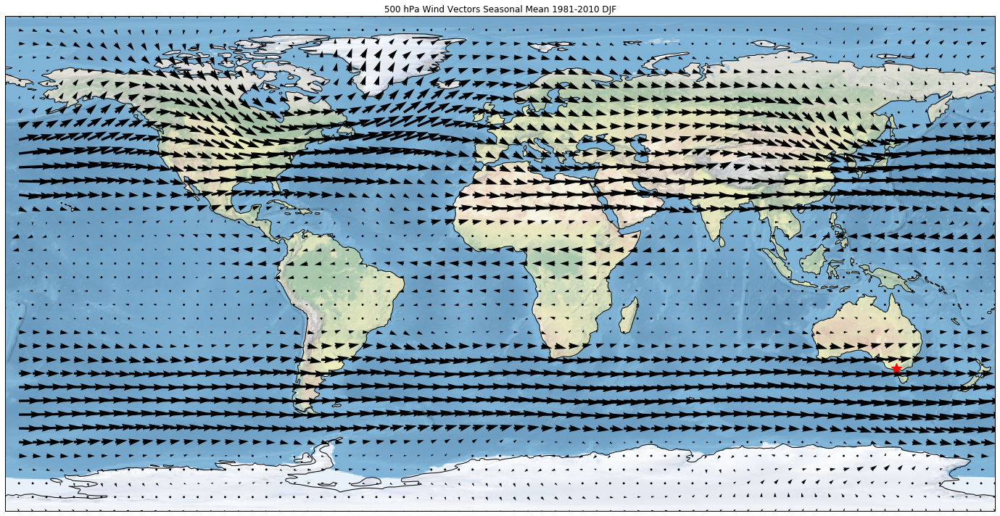

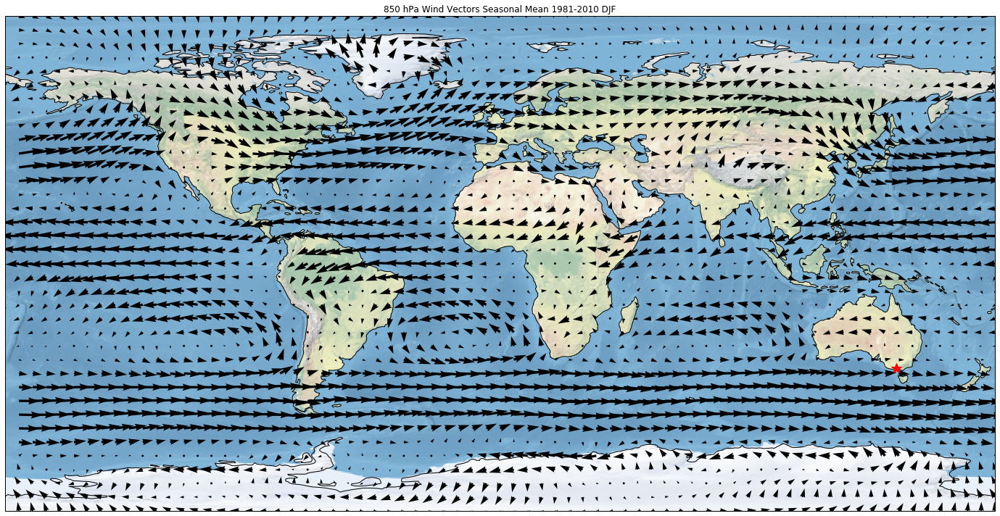

In [0]:
#Plotting seasonal mean winds
elev = ['500','700','850']

ind = [0,2]
for i in range(0,2):
    fig = plt.figure(figsize=(20,10))

    ax = plt.axes(projection=ccrs.PlateCarree() )

    skip = 2
    ax.quiver(means[ind[i]+1]['lon'][::skip], means[ind[i]+1]['lat'][::skip], means[ind[i]+1]['uwnd'][::skip,::skip], means[ind[i]+2]['vwnd'][::skip,::skip], transform = ccrs.PlateCarree())
    ax.coastlines()
    ax.plot(144,-38, marker='*', markersize = 15, color = 'r')
    plt.title(elev[ind[i]]+ ' hPa Wind Vectors Seasonal Mean 1981-2010 DJF')
    plt.tight_layout()
    ax.stock_img()
    plt.show()
    fig.savefig('winds' + elev[ind[i]] + 'djfmean.png')

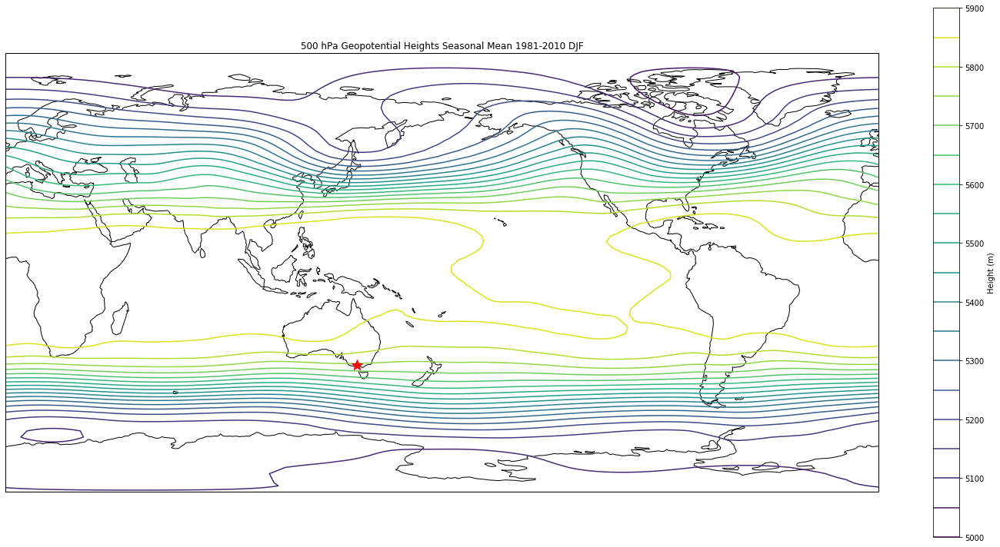

In [0]:
#Plotting seasonal mean Geopotential Heights
fig = plt.figure(figsize=(20,10))

ax = plt.axes(projection=ccrs.PlateCarree(central_longitude = 180) )

plt.contour(means[0]['lon'], means[0]['lat'], means[0]['hgt'], 
         transform=ccrs.PlateCarree(), cmap='viridis', levels = 20)
ax.coastlines()
plt.plot(144-180,-38, marker='*', markersize = 15, color = 'r')
plt.title('500 hPa Geopotential Heights Seasonal Mean 1981-2010 DJF')
plt.colorbar().set_label('Height (m)')
plt.tight_layout()
plt.show()
fig.savefig('hght500djfmean.png')

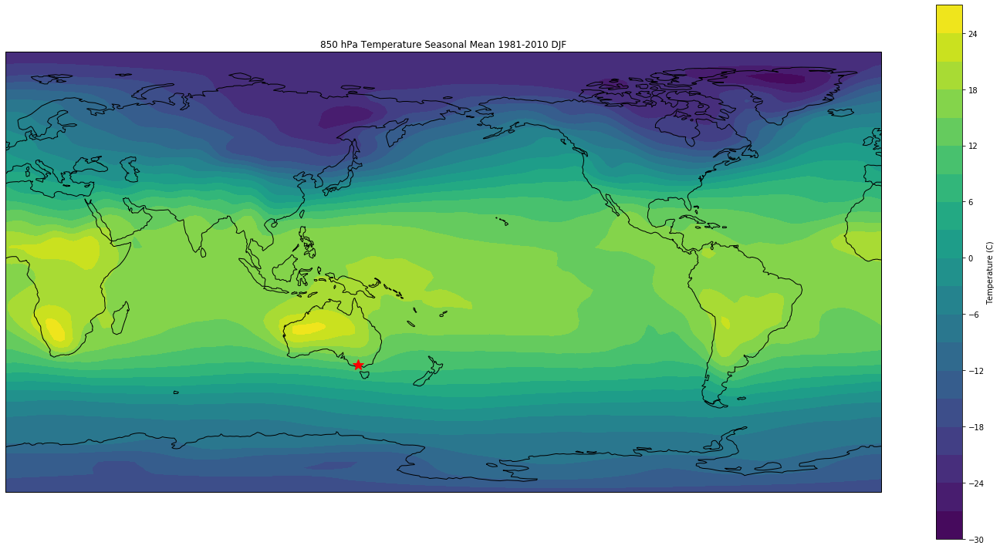

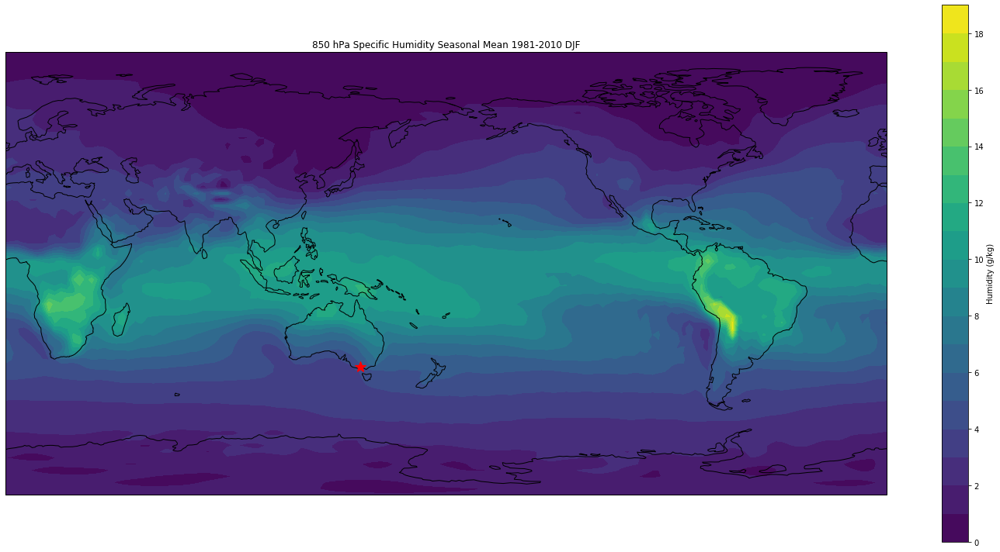

In [0]:
#Plotting seasonal mean Temps and Specific Humidity
names = ['air', 'shum', 'Temperature', 'Specific Humidity', 'Temperature (C)', 'Humidity (g/kg)']
for i in range(0,2):
    fig = plt.figure(figsize=(20,10))

    ax = plt.axes(projection=ccrs.PlateCarree(central_longitude = 180) )

    plt.contourf(means[i+5]['lon'], means[i+5]['lat'], means[i+5][names[i]], 
             transform=ccrs.PlateCarree(), cmap='viridis', levels = 20)
    ax.coastlines()
    plt.plot(144-180,-38, marker='*', markersize = 15, color = 'r')
    plt.title('850 hPa ' + names[i+2] + ' Seasonal Mean 1981-2010 DJF')
    plt.colorbar().set_label(names[i+4])
    plt.tight_layout()
    plt.show()
    fig.savefig(names[i] + '850djfmean.png')  

In [0]:
#loading in extreme precip dates
datefile = xr.open_dataset('/content/melbourne_95_update.nc',engine='netcdf4')
dates = datefile['time']

In [0]:
#downloading daily data from extreme precip days
years = pd.date_range(start='1997-01-01', end='2019-12-01', freq='AS') # 30 years

#heights
hght500 = []
for year in years.year:
    #print('working on '+str(year))
    hght500ds = xr.open_dataset('http://www.esrl.noaa.gov/psd/thredds/dodsC/Datasets/ncep.reanalysis.dailyavgs/pressure/hgt.'+str(year)+'.nc',engine='netcdf4').sel(level=500, time = dates.sel(time = dates['time'].dt.year == year)['time'] )
    hght500.append(hght500ds)
hght500_conc = xr.concat(hght500, dim = 'time')
hght500daily = hght500_conc.mean(dim = 'time')
print('done with hght')

#500mb uwind
uwind500 = []
for year in years.year:
    #print('working on '+str(year))
    uwind500ds = xr.open_dataset('http://www.esrl.noaa.gov/psd/thredds/dodsC/Datasets/ncep.reanalysis.dailyavgs/pressure/uwnd.'+str(year)+'.nc',engine='netcdf4').sel(level=500, time = dates.sel(time = dates['time'].dt.year == year)['time'] )
    uwind500.append(uwind500ds)
uwind500_conc = xr.concat(uwind500, dim='time')
uwind500daily = uwind500_conc.mean(dim = 'time')
print('done with uwind 500')

#500mb vwind
vwind500 = []
for year in years.year:
    #print('working on '+str(year))
    vwind500ds = xr.open_dataset('http://www.esrl.noaa.gov/psd/thredds/dodsC/Datasets/ncep.reanalysis.dailyavgs/pressure/vwnd.'+str(year)+'.nc',engine='netcdf4').sel(level=500, time = dates.sel(time = dates['time'].dt.year == year)['time'] )
    vwind500.append(vwind500ds)
vwind500_conc = xr.concat(vwind500, dim='time')
vwind500daily = vwind500_conc.mean(dim = 'time')
print('done with vwind 500')

#850mb uwind
uwind850 = []
for year in years.year:
    #print('working on '+str(year))
    uwind850ds = xr.open_dataset('http://www.esrl.noaa.gov/psd/thredds/dodsC/Datasets/ncep.reanalysis.dailyavgs/pressure/uwnd.'+str(year)+'.nc',engine='netcdf4').sel(level=850, time = dates.sel(time = dates['time'].dt.year == year)['time'] )
    uwind850.append(uwind850ds)
uwind850_conc = xr.concat(uwind850, dim='time')
uwind850daily = uwind850_conc.mean(dim = 'time')
print('done with uwind 850')

#850mb vwind
vwind850 = []
for year in years.year:
    #print('working on '+str(year))
    vwind850ds = xr.open_dataset('http://www.esrl.noaa.gov/psd/thredds/dodsC/Datasets/ncep.reanalysis.dailyavgs/pressure/vwnd.'+str(year)+'.nc',engine='netcdf4').sel(level=850, time = dates.sel(time = dates['time'].dt.year == year)['time'] )
    vwind850.append(vwind850ds)
vwind850_conc = xr.concat(vwind850, dim='time')
vwind850daily = vwind850_conc.mean(dim = 'time')
print('done with vwind 850')

#850mb temp
temp850 = []
for year in years.year:
    #print('working on '+str(year))
    temp850ds = xr.open_dataset('http://www.esrl.noaa.gov/psd/thredds/dodsC/Datasets/ncep.reanalysis.dailyavgs/pressure/air.'+str(year)+'.nc',engine='netcdf4').sel(level=850, time = dates.sel(time = dates['time'].dt.year == year)['time'] )
    temp850.append(temp850ds)
temp850_conc = xr.concat(temp850, dim='time')
temp850daily = temp850_conc.mean(dim = 'time')
print('done with temp 850')

#850mb sphum
sphum850 = []
for year in years.year:
    #print('working on '+str(year))
    sphum850ds = xr.open_dataset('http://www.esrl.noaa.gov/psd/thredds/dodsC/Datasets/ncep.reanalysis.dailyavgs/pressure/shum.'+str(year)+'.nc',engine='netcdf4').sel(level=850, time = dates.sel(time = dates['time'].dt.year == year)['time'] )
    sphum850.append(sphum850ds)
sphum850_conc = xr.concat(sphum850, dim = 'time')
sphum850daily = sphum850_conc.mean(dim = 'time')

print('done with sphum 850')

#correcting for unit differences
temp850dailycorr = temp850daily['air'] - 273.15
sphum850dailycorr = sphum850daily['shum'] * 1000.

working on 1997
working on 1998
working on 1999
working on 2000
working on 2001
working on 2002
working on 2003
working on 2004
working on 2005
working on 2006
working on 2007
working on 2008
working on 2009
working on 2010
working on 2011
working on 2012
working on 2013
working on 2014
working on 2015
working on 2016
working on 2017
working on 2018
working on 2019
done with hght
done with uwind 500
done with vwind 500
done with uwind 850
done with vwind 850
done with temp 850
done with sphum 850


In [0]:
dailyavgs = [hght500daily,uwind500daily,vwind500daily,uwind850daily,vwind850daily,temp850dailycorr,sphum850dailycorr]

anoms = []

for i in range(0, 7):
    anoms.append(dailyavgs[i] - means[i])


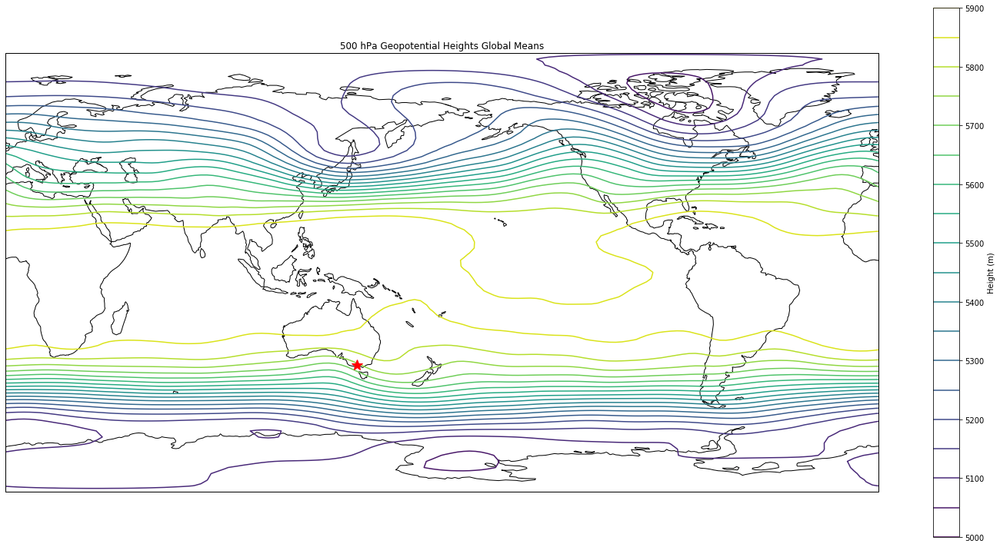

In [0]:
####plotting global mean fields for 95%+ precip days

#plotting 500 hPa geopotential heights
fig = plt.figure(figsize=(20,10))
ax = plt.axes(projection=ccrs.PlateCarree(central_longitude = 180) )
plt.contour(dailyavgs[0]['lon'], dailyavgs[0]['lat'], dailyavgs[0]['hgt'], 
         transform=ccrs.PlateCarree(), cmap='viridis', levels = 20)
ax.coastlines()
plt.plot(144-180,-38, marker='*', markersize = 15, color = 'r')
plt.title('500 hPa Geopotential Heights Global Means')
plt.colorbar().set_label('Height (m)')
plt.tight_layout()
plt.show()
fig.savefig('hght500globmean.png')

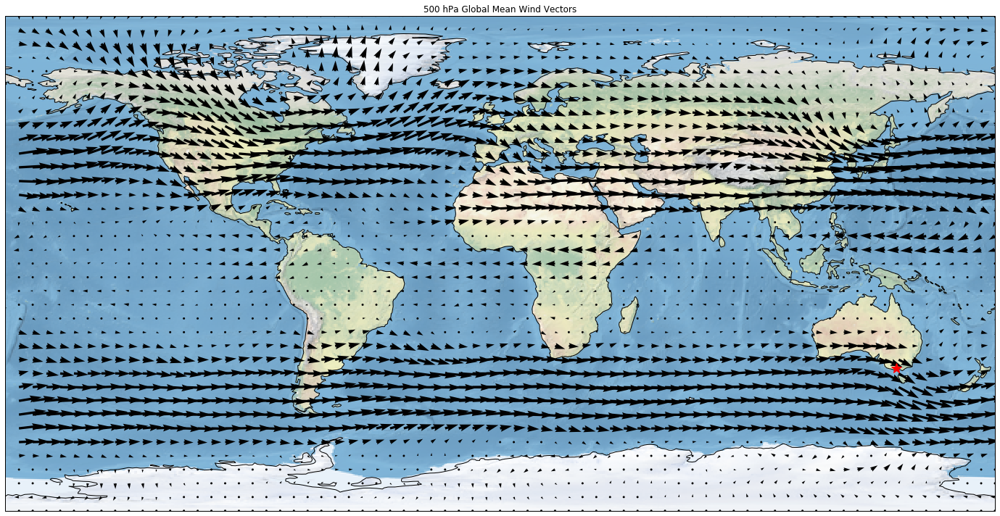

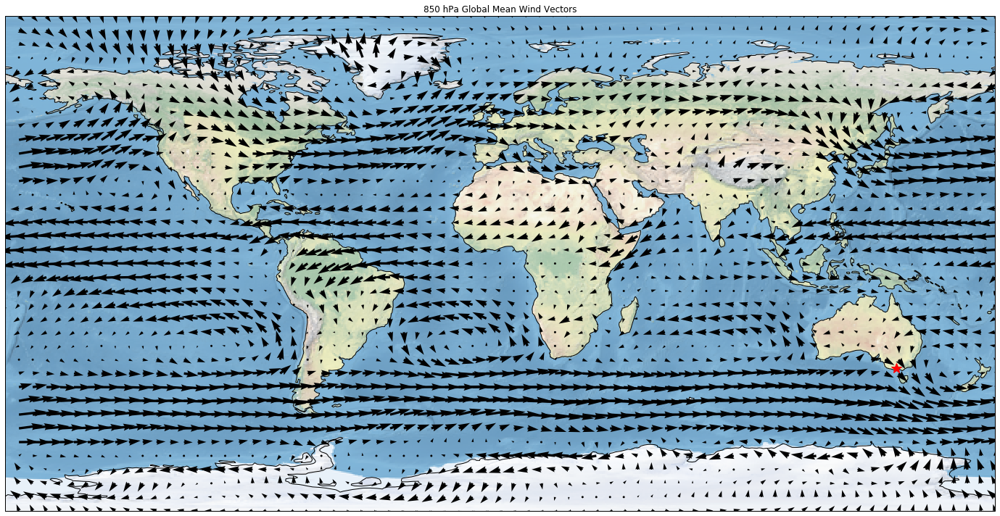

In [0]:
#Plotting winds
elev = ['500','700','850']
ind = [0,2]

for i in range(0,2):
    fig = plt.figure(figsize=(20,10))
    ax = plt.axes(projection=ccrs.PlateCarree() )
    skip = 2
    plt.quiver(dailyavgs[ind[i]+1]['lon'][::skip], dailyavgs[ind[i]+1]['lat'][::skip], dailyavgs[ind[i]+1]['uwnd'][::skip,::skip], dailyavgs[ind[i]+2]['vwnd'][::skip,::skip], transform=ccrs.PlateCarree())
    ax.coastlines()
    plt.plot(144,-38, marker='*', markersize = 15, color = 'r')
    plt.title(elev[ind[i]]+ ' hPa Global Mean Wind Vectors')
    plt.tight_layout()
    ax.stock_img()
    plt.show()
    fig.savefig('winds' + elev[ind[i]] + 'globmean.png')

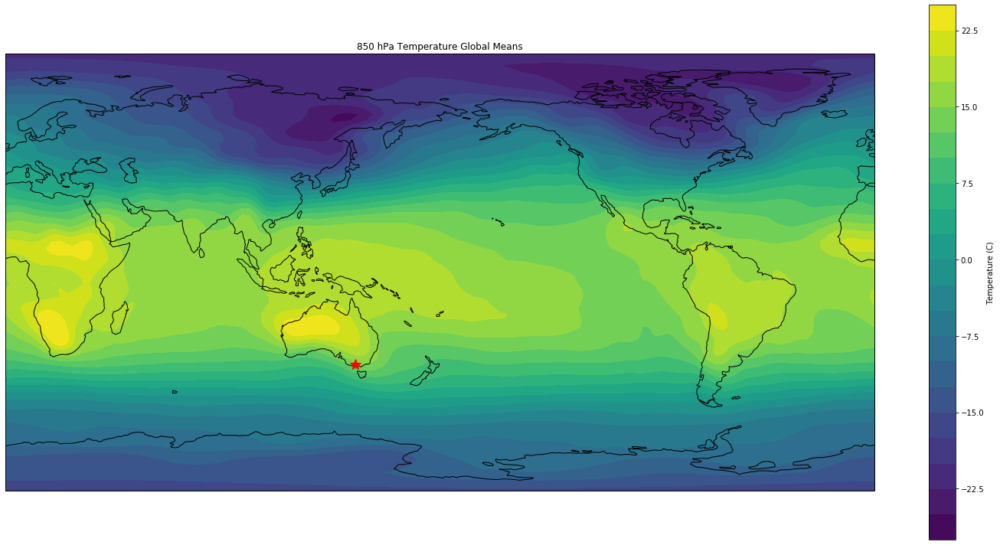

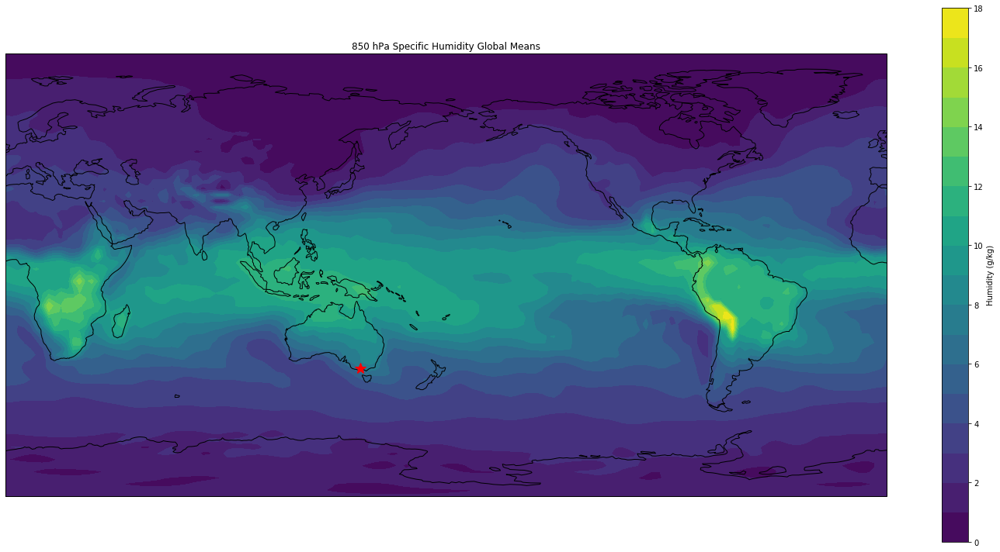

In [0]:
#Plotting Temps and Specific Humidity
names = ['air', 'shum', 'Temperature', 'Specific Humidity', 'Temperature (C)', 'Humidity (g/kg)']

for i in range(0,2):
    fig = plt.figure(figsize=(20,10))
    ax = plt.axes(projection=ccrs.PlateCarree(central_longitude = 180) )
    plt.contourf(dailyavgs[i+5]['lon'], dailyavgs[i+5]['lat'], dailyavgs[i+5], 
             transform=ccrs.PlateCarree(), cmap='viridis', levels = 20)
    ax.coastlines()
    plt.plot(144-180,-38, marker='*', markersize = 15, color = 'r')
    plt.title('850 hPa ' + names[i+2] + ' Global Means')
    plt.colorbar().set_label(names[i+4])
    plt.tight_layout()
    plt.show()
    fig.savefig(names[i] + '850globmean.png') 

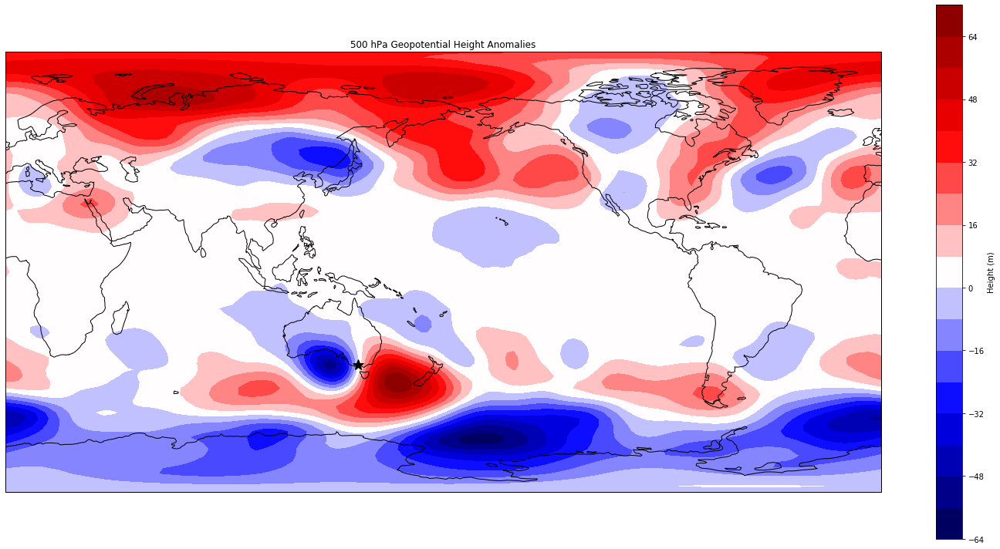

In [0]:
#Plotting anomalies

#plotting height anomalies
fig = plt.figure(figsize=(20,10))
ax = plt.axes(projection=ccrs.PlateCarree(central_longitude = 180) )
plt.contourf(anoms[0]['lon'], anoms[0]['lat'], anoms[0]['hgt'], 
         transform=ccrs.PlateCarree(), cmap='seismic', levels = 20)
ax.coastlines()
plt.plot(144-180,-38, marker='*', markersize = 15, color = 'black')
plt.title('500 hPa Geopotential Height Anomalies')
plt.colorbar().set_label('Height (m)')
plt.tight_layout()
plt.show()
fig.savefig('hght500anom.png')

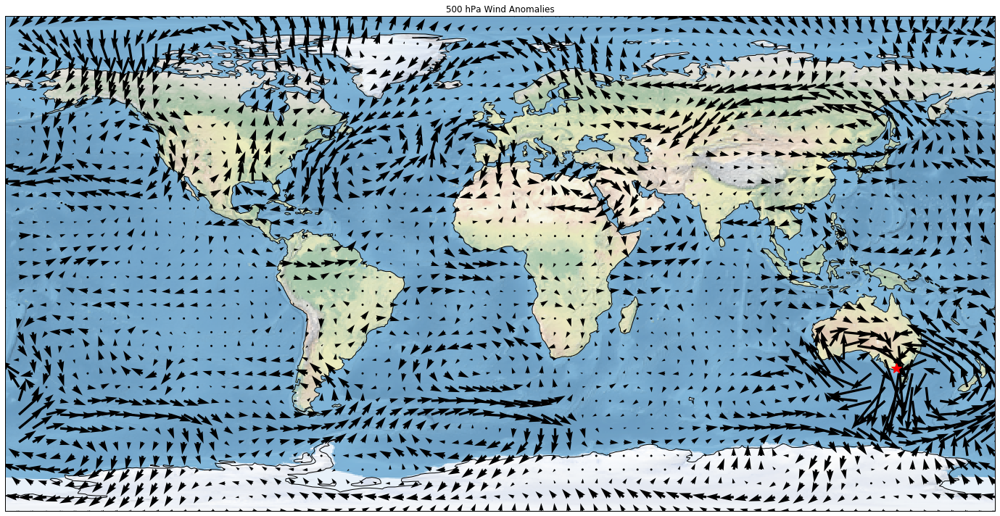

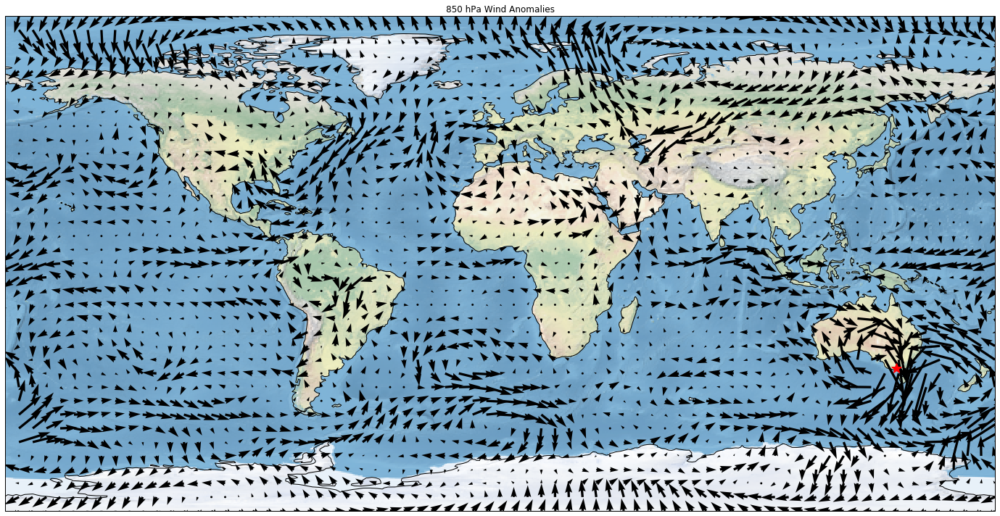

In [0]:
#plotting wind anomalies
skip = 2

for i in range(0,2):
    fig = plt.figure(figsize=(20,10))
    ax = plt.axes(projection=ccrs.PlateCarree())
    plt.quiver(anoms[ind[i]+1]['lon'][::skip], anoms[ind[i]+1]['lat'][::skip], anoms[ind[i]+1]['uwnd'][::skip,::skip], anoms[ind[i]+2]['vwnd'][::skip,::skip], transform=ccrs.PlateCarree())
    ax.coastlines()
    plt.plot(144,-38, marker='*', markersize = 15, color = 'r')
    plt.title(elev[ind[i]]+ ' hPa Wind Anomalies')
    plt.tight_layout()
    ax.stock_img()
    plt.show()
    fig.savefig('winds' + elev[ind[i]] + 'anom.png')

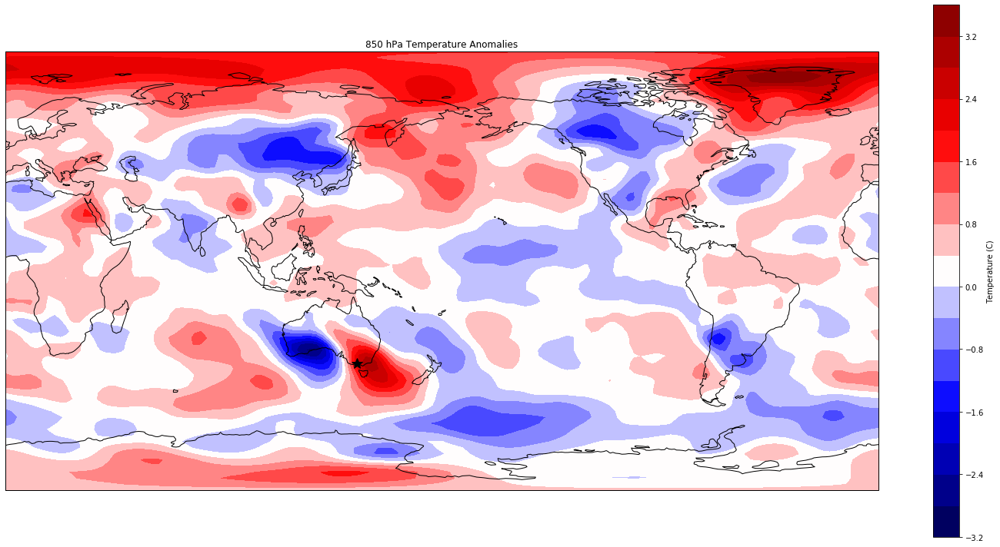

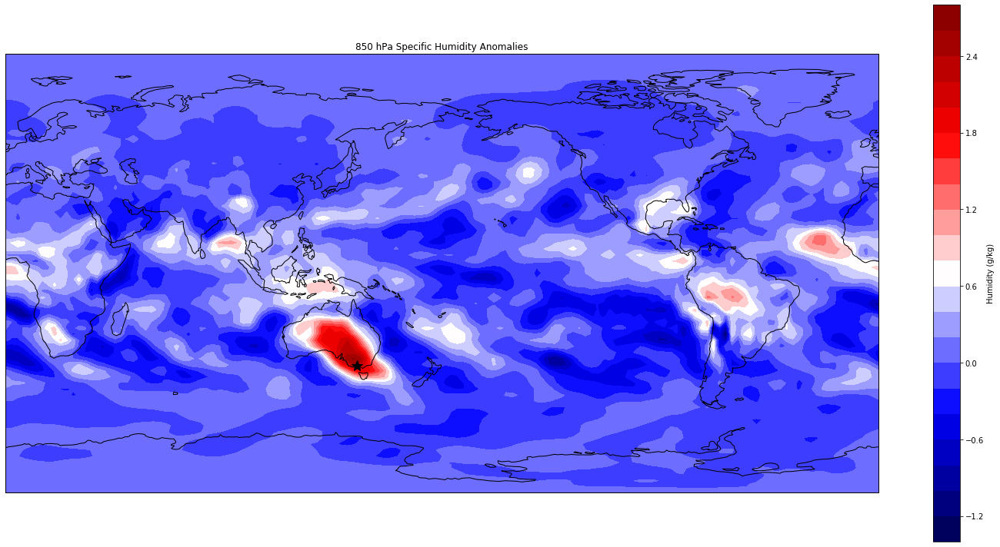

In [0]:
#Plotting temperature and specific humidity anomalies
names = ['air', 'shum', 'Temperature', 'Specific Humidity', 'Temperature (C)', 'Humidity (g/kg)']
for i in range(0,2):
    fig = plt.figure(figsize=(20,10))

    ax = plt.axes(projection=ccrs.PlateCarree(central_longitude = 180) )

    plt.contourf(anoms[i+5]['lon'], anoms[i+5]['lat'], anoms[i+5][names[i]], 
             transform=ccrs.PlateCarree(), cmap='seismic', levels = 20)
    ax.coastlines()
    plt.plot(144-180,-38, marker='*', markersize = 15, color = 'black')
    plt.title('850 hPa ' + names[i+2] + ' Anomalies')
    plt.colorbar().set_label(names[i+4])
    plt.tight_layout()
    plt.show()
    fig.savefig(names[i] + '850anom.png') 